Dados faltantes:
Entity                                                             0
Year                                                               0
Access to electricity                                             10
Access to clean fuels for cooking                                169
Renewable-electricity-generating-capacity-per-capita             931
Financial flows to developing countries                         2089
Renewable energy share in the total final energy consumption     194
Electricity from fossil fuels                                     21
Electricity from nuclear                                         126
Electricity from renewables                                       21
Low-carbon electricity                                            42
Primary energy consumption per capita                              0
Energy intensity level of primary energy                         207
Value_co2_emissions_kt_by_country                                428
Renewables       

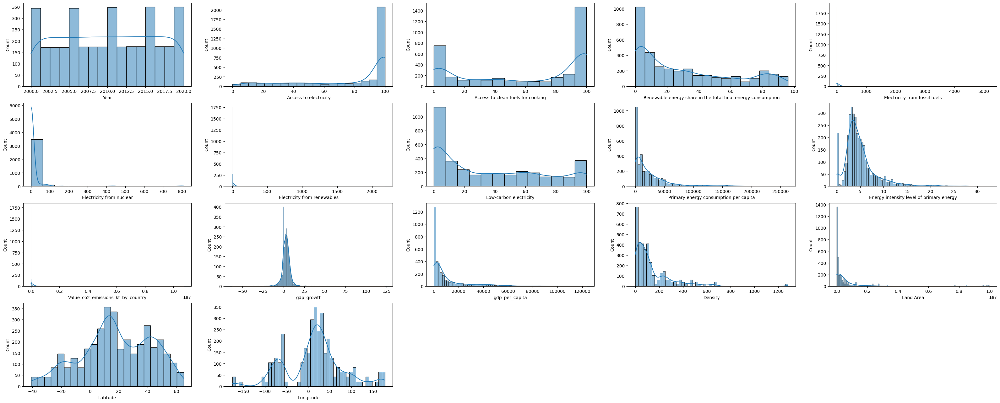

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot  as plt 
import seaborn as sns

dataset_original = pd.read_csv('energia_sustentavel.csv', sep=',', decimal='.')

dataset_original['Density'] = pd.to_numeric(dataset_original['Density'], errors='coerce')

lugares = dataset_original['Entity'].copy(deep=True)

#Verificar se tem nulos
print("Dados faltantes:")
print(dataset_original.isna().sum())

#Remover colunas que tem muito dado faltante
dataset_original = dataset_original.drop(['Entity', 'Financial flows to developing countries', 'Renewables','Renewable-electricity-generating-capacity-per-capita' ], axis=1)


dataset_original.fillna(0, inplace=True)

print("Dados duplicados:")
print(dataset_original.duplicated().sum())


plt.figure(figsize=(40, 20))

for index, value in enumerate(dataset_original.columns):
    plt.subplot(5, 5,index+1)
    sns.histplot(dataset_original[value], kde=True)

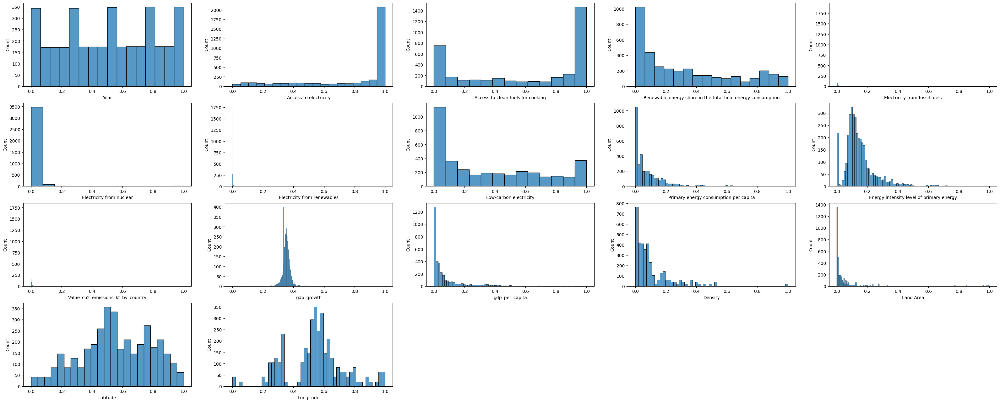

In [2]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler


scaler = MinMaxScaler()
dataset_normalizado = pd.DataFrame(scaler.fit_transform(dataset_original), columns=dataset_original.columns)
plt.figure(figsize=(40, 20))

for index, value in enumerate(dataset_normalizado.columns):
    plt.subplot(5, 5,index+1)
    sns.histplot(dataset_normalizado[value])
    plt.xlabel(dataset_original.columns[index])

In [29]:
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


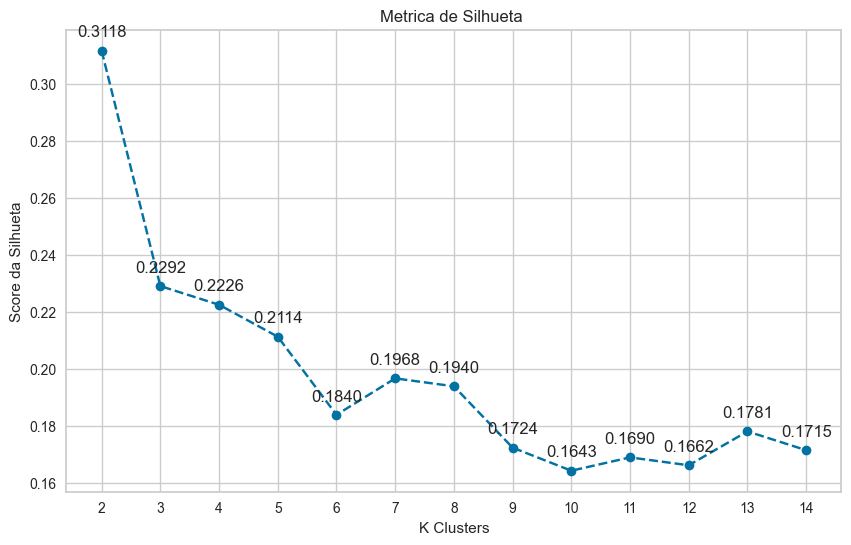

In [30]:
from kmeans_service import KmeansAnalysis

kmeansAnalysis = KmeansAnalysis(dataset_normalizado)
kmeansAnalysis.test_multiple_k_silhuete(2, 15)
kmeansAnalysis.plot_silhuete_scores()

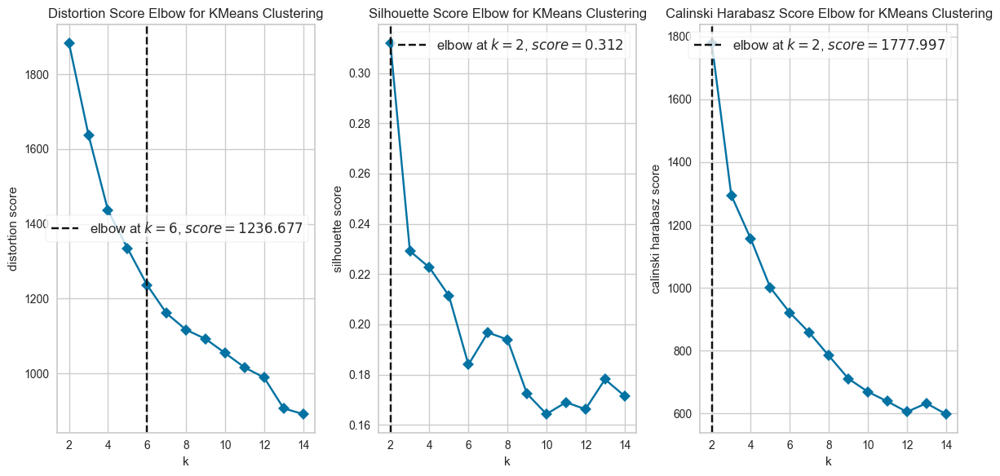

In [23]:
from elbow_service import plot_all_elbows

plot_all_elbows(2,15,dataset_normalizado)

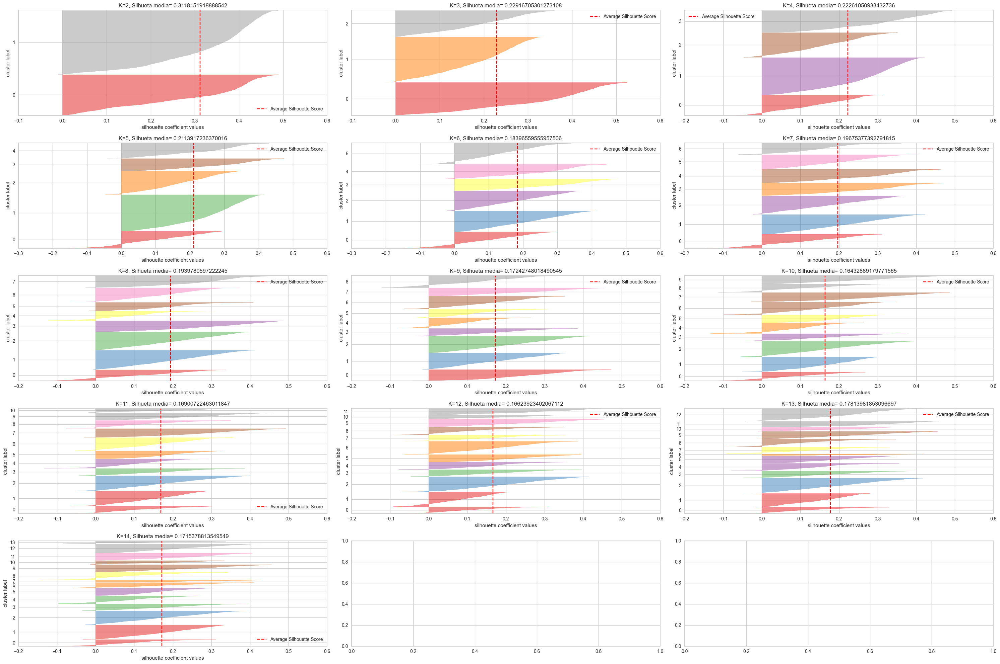

In [24]:
kmeansAnalysis.plot_silhuetes_visualizer(5,3)

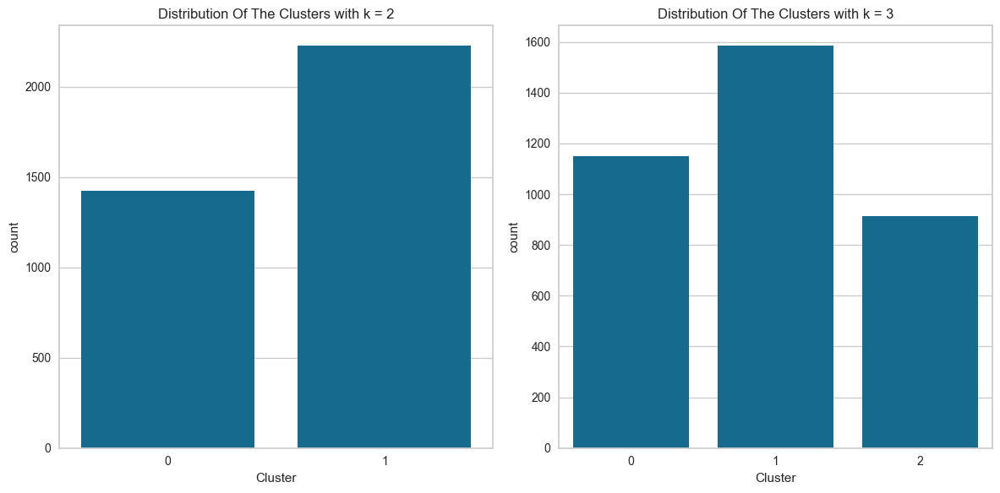

In [42]:
kmeansAnalysis.save_kmeans_results(2)

df_with_kmeans_2 = kmeansAnalysis.df_with_last_cluster_labels.copy(deep=True)

kmeansAnalysis.save_kmeans_results(3)

df_with_kmeans_3 = kmeansAnalysis.df_with_last_cluster_labels.copy(deep=True)

from plot_service  import plot_distributions_clusters

plot_distributions_clusters([df_with_kmeans_2["Cluster"], df_with_kmeans_3["Cluster"]], [2,3], 1,2)



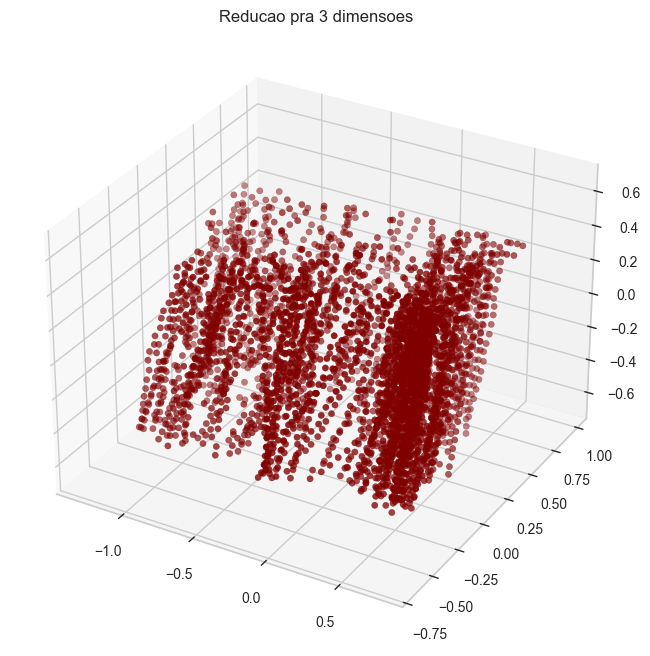

In [10]:
#Aplicando o PCA para duas variaveis, vamos tentar identificar a distribuicao. 
# Aparentemente esta com uma densidade extremamente alta. 

from pca_service import PCAAnalys 

PCA_3d = PCAAnalys(3, dataset_normalizado)
pca_df= PCA_3d.apply_pca()
PCA_3d.plot_pca()


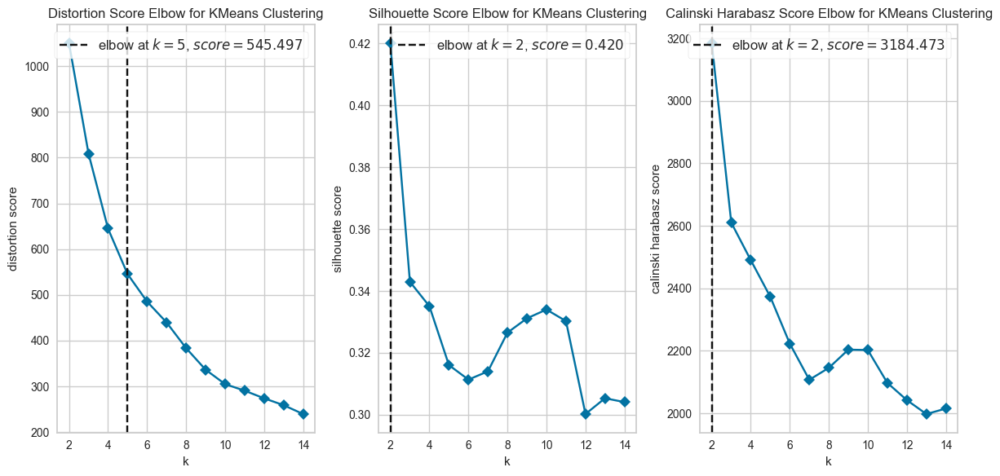

In [37]:
from elbow_service import plot_all_elbows

plot_all_elbows(2,15,pca_df)

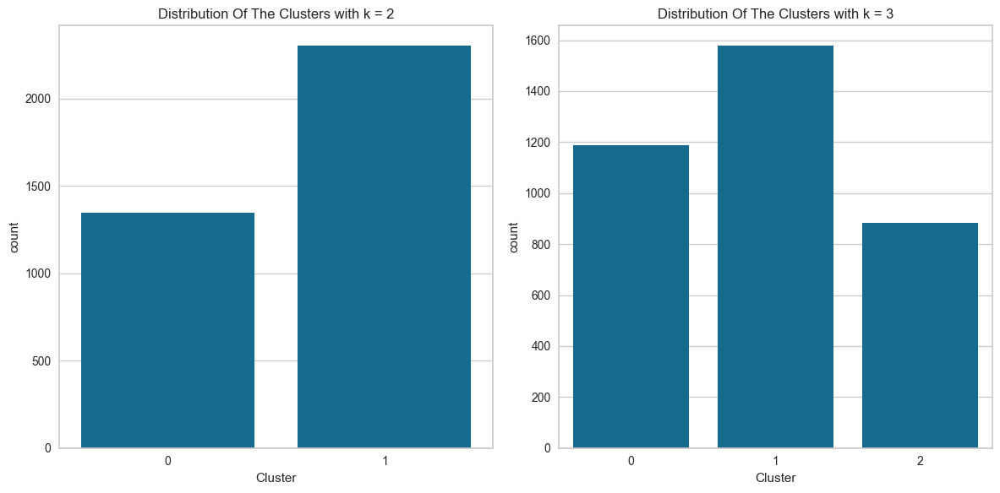

In [46]:
from kmeans_service import KmeansAnalysis 

KMEANS_PCA = KmeansAnalysis( pca_df)

KMEANS_PCA.save_kmeans_results(2)

df_PCA_with_kmeans_2 = KMEANS_PCA.df_with_last_cluster_labels.copy(deep=True)

KMEANS_PCA.save_kmeans_results(3)

df_PCA_with_kmeans_3 = KMEANS_PCA.df_with_last_cluster_labels.copy(deep=True)

from plot_service  import plot_distributions_clusters

plot_distributions_clusters([df_PCA_with_kmeans_2["Cluster"], df_PCA_with_kmeans_3["Cluster"]], [2,3], 1,2)


In [49]:
dataset_final= dataset_original.copy(deep = True)
dataset_final['ClusterK2'] =df_with_kmeans_2 ['Cluster']
dataset_final['ClusterK3'] =df_with_kmeans_3 ['Cluster']
dataset_final['Pais'] = lugares

In [ ]:
#Faz sentido ser 3 grupos. 
#O grupo 2 seriam os paises que tem uma boa taxa de energia sustentavel
#O grupo 0 sao os que tem media taxa de energia sustentavel
#O grupo 1  sao os que tem baixa taxa de energia sustentavel

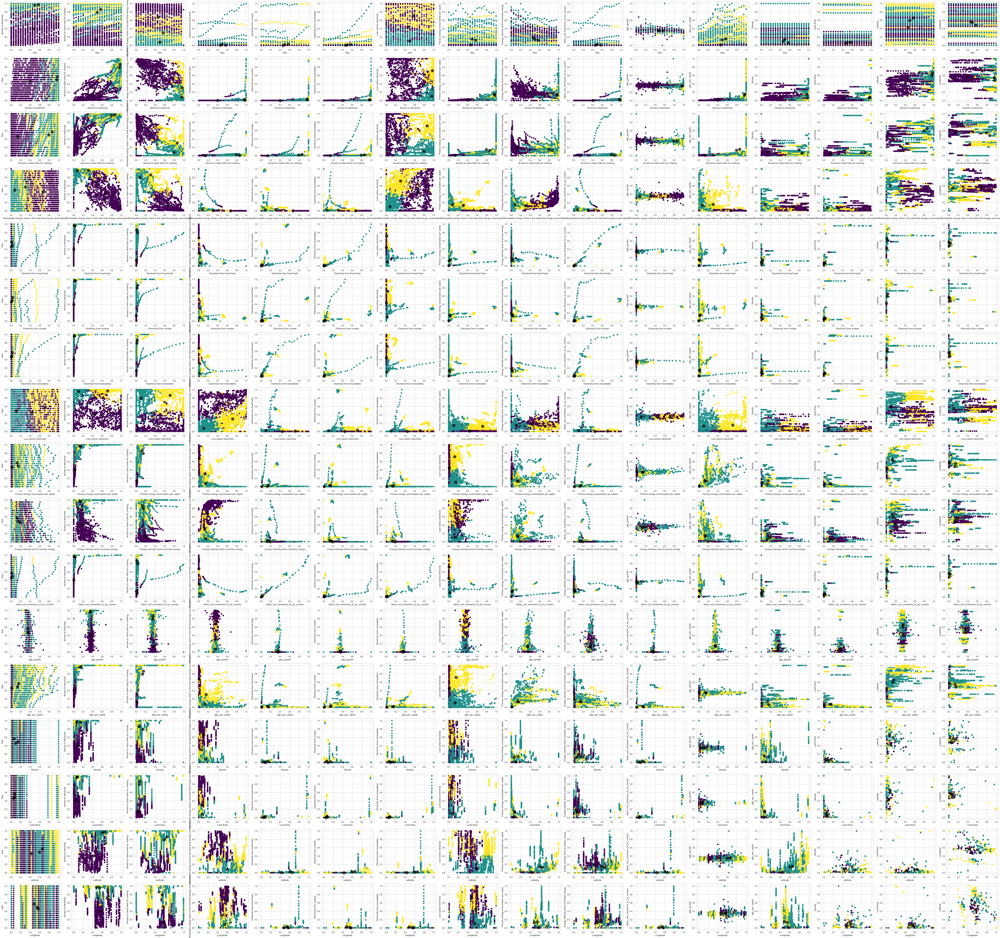

In [52]:

kmeansAnalysis.plot_2_a_2_after_kmeans_apply(3)
#Fazendo uma analise breve dos plots 2 a 2 podemos ver que os dados estao MUITO aglomerados e sem forma esferica, o que dificulta para utilizar Kmeans